# Building Regularization

[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/geoai/blob/main/docs/examples/building_regularization.ipynb)

## Install package
To use the `geoai-py` package, ensure it is installed in your environment. Uncomment the command below if needed.

In [1]:
 %pip install geoai-py

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.8/128.8 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 537.2/537.2 kB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 63.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 744.5/744.5 kB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 4.7 MB/s eta 0:00:00


## Import package

In [2]:
import geoai

## Download sample data

In [3]:
naip_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train.tif"
)
masks_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_building_masks.tif"

In [4]:
masks_path = geoai.download_file(masks_url)
naip_path = geoai.download_file(naip_url)

naip_building_masks.tif: 100%|██████████| 61.6k/61.6k [00:00<00:00, 2.74MB/s]
naip_train.tif: 100%|██████████| 12.1M/12.1M [00:00<00:00, 27.1MB/s]


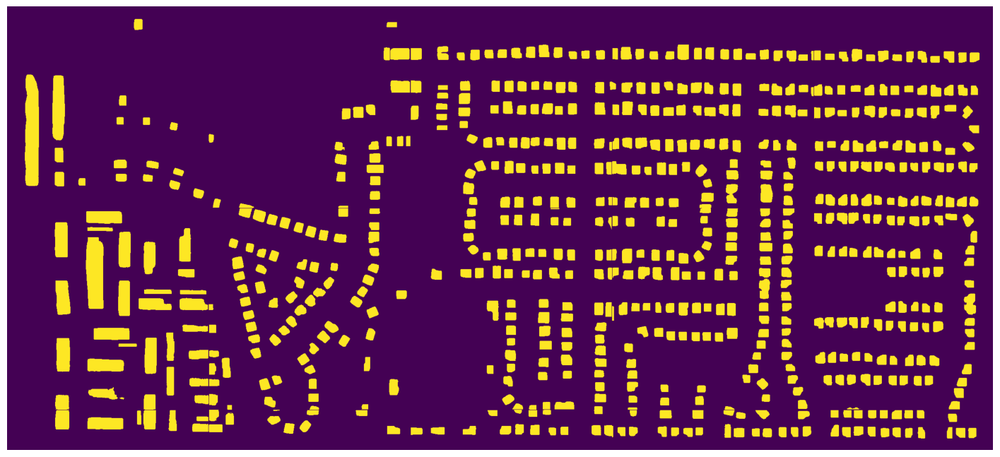

In [5]:
geoai.view_image(masks_path, figsize=(18, 10))

In [6]:
geoai.create_split_map(
    left_layer=masks_url,
    right_layer=naip_url,
    left_label="Building Masks",
    right_label="NAIP Imagery",
    left_args={
        "colormap": {"255": "#0000ff"},
        "opacity": 0.5,
    },
    basemap=naip_url,
)

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

## Convert raster to vector

In [7]:
gdf = geoai.raster_to_vector(masks_path, output_path="naip_building_masks.geojson")

Vectorized data saved to naip_building_masks.geojson


In [8]:
geoai.view_vector_interactive(
    gdf, style_kwds={"color": "blue", "fillOpacity": 0.4}, tiles=naip_url
)

In [9]:
geoai.create_split_map(
    left_layer=gdf,
    right_layer=naip_url,
    left_label="Buildings",
    right_label="NAIP Imagery",
    left_args={"style": {"color": "blue"}, "fillOpacity": 0.4},
    basemap=naip_url,
)

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

## Building regularization

In [10]:
gdf_regularized = geoai.regularization(
    building_polygons=gdf,
    angle_tolerance=10,
    simplify_tolerance=0.5,
    orthogonalize=True,
    preserve_topology=True,
)

In [11]:
geoai.view_vector_interactive(
    gdf_regularized, style_kwds={"color": "red", "fillOpacity": 0.4}, tiles=naip_url
)

In [12]:
geoai.create_split_map(
    left_layer=gdf_regularized,
    right_layer=naip_url,
    left_label="Regularized Buildings",
    right_label="NAIP Imagery",
    left_args={"style": {"color": "red"}, "fillOpacity": 0.4},
    basemap=naip_url,
)

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

## Hybrid regularization

In [13]:
gdf_hybrid = geoai.hybrid_regularization(gdf)

In [14]:
geoai.view_vector_interactive(
    gdf_hybrid, style_kwds={"color": "green", "fillOpacity": 0.4}, tiles=naip_url
)

In [15]:
geoai.create_split_map(
    left_layer=gdf_regularized,
    right_layer=naip_url,
    left_label="Regularized Buildings",
    right_label="NAIP Imagery",
    left_args={"style": {"color": "green", "fillOpacity": 0.4}},
    basemap=naip_url,
)

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

## Adaptive regularization

In [16]:
gdf_adaptive = geoai.adaptive_regularization(
    building_polygons=gdf,
    simplify_tolerance=0.5,
    area_threshold=0.9,
    preserve_shape=True,
)

In [17]:
geoai.view_vector_interactive(
    gdf_adaptive, style_kwds={"color": "yellow", "fillOpacity": 0.4}, tiles=naip_url
)

In [18]:
geoai.create_split_map(
    left_layer=gdf_adaptive,
    right_layer=naip_url,
    left_label="Adaptive Regularization Buildings",
    right_label="NAIP Imagery",
    left_args={"style": {"color": "yellow", "fillOpacity": 0.4}},
    basemap=naip_url,
)

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

## Compare regularization methods

In [19]:
import leafmap.foliumap as leafmap

In [20]:
m = leafmap.Map()
m.add_basemap("SATELLITE")
m.add_gdf(gdf, layer_name="Original")
m.add_gdf(
    gdf_regularized, style={"color": "red", "fillOpacity": 0}, layer_name="Regularized"
)
m.add_gdf(gdf_hybrid, style={"color": "green", "fillOpacity": 0}, layer_name="Hybrid")
m.add_gdf(
    gdf_adaptive, style={"color": "yellow", "fillOpacity": 0}, layer_name="Adaptive"
)
legend = {
    "Original": "blue",
    "Regularized": "red",
    "Hybrid": "green",
    "Adaptive": "yellow",
}
m.add_legend(title="Building Footprints", legend_dict=legend)
m